<font face="B Mitra" size=4>
<div dir=rtl align=center>
<br>
<img src="https://aut.ac.ir/templates/tmpl_modern01/images/logo_fa.png" alt="Amirkabir University Logo" width="100">
<br>
<font size=6>
<b>پروژه سوم داده کاوی</b>
<br>
<b><font size=5> استاد درس: دکتر فاطمه شاکری</b>
<br>
<font size=4>
<b>مهسا گودرزی - 9912043</b>
<br>
<hr>
</div>
</font>

<font face="B Mitra">
<div dir=rtl>
<font size=5>
کتابخانه های موردنیاز را در این بخش بارگذاری کنید.
</p>
</font>
</div>
</font>

In [ ]:
!pip install langdetect
!pip install scispacy
!pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.4/en_core_sci_lg-0.5.4.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993227 sha256=80150383d8bf52d3bfca9b16477a06e22599c9ea7e669a70d7b6a43ce226535a
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 853.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 kB 19.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.1/71.1 kB 8.7 MB/s eta 0:00:00
  Using cached pybind11-2.6.1-py2.py3-none-any.whl (188 kB)
  Created wheel for nmslib: filename=nmslib-2.1.1-cp310-cp310-linux_x86_64.whl size=13578641 sha256=5f4c9763b02bca375d781bb91fc7c490068b092e6c4ac76cdfe136

<font face="B Mitra">
<div dir=rtl>
<font size=5>
نصب پکیج <code>spacy</code> ممکن است وابسته به سیستم‌عامل و پکیج‌منیجر شما نیاز به دستوری متفاوت داشته‌باشد. دستور مناسب را می‌تواند با استفاده از
<a href="https://spacy.io/usage">این لینک</a> بیابید.
</p>
</font>
</div>
</font>

In [ ]:
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%config InlineBackend.figure_formats = ['svg']
import seaborn as sns

# Used to draw a progress bar for longer method calls
from tqdm import tqdm

# Used to detect language used in each document
from langdetect import detect
from langdetect import DetectorFactory
DetectorFactory.seed = 0

# Pre-trained natural language processing pipeline for biomedical use
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
import en_core_sci_lg

# Used to import list of punctuations
import string

# Feature extraction (text vectorizers)
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

# Dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Clustering and evaluation
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

# Topic modeling
from sklearn.decomposition import LatentDirichletAllocation

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from collections import Counter
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.decomposition import NMF

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<font face="B Mitra">
<div dir=rtl>
<font size=6>
<b> لود کردن مجموعه داده </b>
<br>
<p align="justify">
<font size=5>
فایل مجموعه داده در <a href="https://drive.google.com/file/d/15E8FLX0C-6qpK-lDBEQJXw00Lsdcvjae/view?usp=sharing">گوگل درایو</a> در اختیار شما قرار گرفته است:
<br>
همچنین در صورت استفاده از گوگل کولب با استفاده از دستور زیر میتوانید مجموعه داده را از گوگل درایو در نوتبوک خود دانلود کنید.
</p>
</font>
</div>
</font>

In [ ]:
!gdown 15E8FLX0C-6qpK-lDBEQJXw00Lsdcvjae

Downloading...
From (original): https://drive.google.com/uc?id=15E8FLX0C-6qpK-lDBEQJXw00Lsdcvjae
From (redirected): https://drive.google.com/uc?id=15E8FLX0C-6qpK-lDBEQJXw00Lsdcvjae&confirm=t&uuid=e262c362-dc5c-4453-bfb8-8a4d375ea5f3
To: /content/10k_df.csv
100% 341M/341M [00:02<00:00, 139MB/s]


<font face="B Mitra">
<div dir=rtl>
<font size=5>
در شروع کار، دیتافریم موردنظر خود را ایجاد کردیم و مقادیر خالی را با space جایگزین کردیم.
دلیل این کار جلوگیری از خطا در مصورسازی انتهایی است.<br>
سپس با توجه به زمانبر بودن اجرا، حداقل یک سمپل 1500 تایی نمونه برداری کردیم.
<br>
برای کسب نتایج بهتر و مصورسازی مناسب‌تر می‌توانیم تعداد سمپل را افزایش دهیم.
</p>
</font>
</div>

In [ ]:
df_10k = pd.read_csv('10k_df.csv')

In [ ]:
df_10k.fillna(value=" ", inplace=True)

In [ ]:
df = df_10k.sample(1500, random_state=42)
del df_10k

<font face="B Mitra">
<div dir=rtl>
<font size=5><font color='green'>
می‌بینیم که داده‌های ما، دارای 8 ویژگی هستند که ویژگی body_text مد نظر ما است و در مراحل بعدی قرار است تا بر مقادیر موجود در این ستون پردازش متن انجام دهیم.
</p>
</font>
</div>

In [ ]:
df.head()

,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary
6252,fefd6cdcddcb00d1ba2ef1a0d3bba9f312010a1d,10.1111/j.1524-4733.2008.00379.x,,China is the biggest country in the world that...,"Li, Youing. Sun, Xin. Wang, Li",Evidence-Based Medicine in China,Value in Health,Not provided.
4684,2a3d080d5dcf6771db002366691f35e5d6f0e493,10.1007/s13238-010-0029-7,,"✉ Correspondence: zlshi@wh.iov.cn Bat, the onl...","Shi, Zhengli",Bat and virus,Protein & Cell,Not provided.
1731,2de657aabab331e75657bfc1443542fd345b6f26,10.1016/j.ccc.2019.06.001,KEYWORDS\nPandemic Influenza Disaster prepared...,Outbreaks of infectious disease pose unique ch...,"Maves, Ryan C.. Jamros, Christina M.. Smith...",Intensive Care Unit Preparedness During<br>Pa...,Crit Care Clin,KEYWORDS\nPandemic Influenza Disaster<br>prep...
4742,bc22758234283f024f16e2dbe660bc909b512b92,10.1016/j.vetpar.2007.11.020,Cryptosporidium parvum is recognized as one of...,Diarrhoeal diseases of infectious aethiology r...,"Klein, Pavel. Kleinová, Tereza. Volek,<br>Z...",Effect of Cryptosporidium parvum infection on...,Veterinary Parasitology,Cryptosporidium parvum is recognized as one o...
4521,a204aafa38365dbcc0a26af3ca2c6d3313d7fab2,10.1111/irv.12518,", Brazil, in the period of Background: The res...",The inclusion criteria for asymptomatic adults...,"Moreira, Luciana Peniche. Watanabe, Aripuana...",Respiratory syncytial virus evaluation among<...,Influenza Other Respir Viruses,", Brazil, in the period of Background: The<br..."


<font face="B Mitra">
<div dir=rtl>
<font size=6>
<b> پیش پردازش متن</b>
<br>
<p align="justify">
<font size=5>
 برای پیش پردازش متون از کتابخانه های مختلفی از جمله NLTK ،Gensim یا Spacy میتوان استفاده کرد.
 <br>
 مواردی که در پیش پردازش متون باید به آن توجه کرد.
 <ol>
 <br>
 <li> <b>تشخیص زبان مورداستفاده مقاله ها:</b>
  در این مجموعه داده میتوانید  با استفاده از کتابخانه langdetect زبان مورد استفاده مقاله را در ویژگی <code>body_text</code> بررسی کنید.
 با توجه به نتیجه نهایی خواهید دید که زبان انگلیسی زبان غالب در این مقاله هاست بنابراین میتوان مقاله های غیر انگلیسی را حذف کرد.
 </li>
 <li> <b>توکنایز کردن (Tokenize) مدل ها:</b>
 در این مجموعه داده از  پایپ لاین  <code>en_core_sci_lg</code> از کتابخانه  spaCy به دلیلی پشتبانی از داده های زیستی و پزشکی و با بردارهای 600 هزار کلمه ای و واژگان بزرگتر میتوانیم استفاده کنیم.<br>
 به دلیل اینکه SpaCy حداکثر یک میلیون کاراکتر را بررسی میکند میتوان با استفاده از max_length این محدودیت را کاهش داد:
 لطفا از parser مشخص شده در بخش زیر برای توکنایز کردن متن خود استفاده کنید.

 </li>
 <li> <b> Lemmatization یا Stemming (ریشه یابی) </b>
 </li>
 <li> <b>حذف Stopwords</b> </li>
 <li> <b>حذف علائم نشانه گذاری</b> </li>
 </ol>
درمورد هر یک از موارد بالا جستجو کنید و پیش پردازش های لازم را برای ویژگی "body text" مقاله انجام دهید.
</p>
</font>
</div>
</font>

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
مقادیر ویژگی body_text را در لیستی به نام text ذخیره می‌کنیم.
</p>
</font>
</div>
</font>

In [ ]:
text=df['body_text'].values.tolist()

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
تابعی برای تشخیص زبان متن مشخص می‌کنیم که با استفاده از ماژول detect از کتابخانه langdetect زبان مورد استفاده متن (مانند انگلیسی) را به عنوان خروجی تابع برمی‌گرداند.
</p>
</font>
</div>
</font>

In [ ]:
def detect_language(text):
    try:
        lang = detect(text)
        return lang
    except:
        return None

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
برای هر مقاله، زبان آن را تشخیص داده و در یک لیست به نام languages ذخیره می‌کنیم.
سپس تعداد مقالات برای هر زبان را مشخص کرده و در خروجی چاپ می‌کنبم. می‌بینیم که از بین 1500 مقاله، 1454 مقاله به زبان انگلیسی هستند.

</p>
</font>
</div>
</font>

In [ ]:
languages = [detect_language(article) for article in text]
language_counts = Counter(languages)
print(language_counts)

Counter({'en': 1454, 'de': 25, 'fr': 8, 'es': 8, 'it': 2, 'nl': 2, 'pt': 1})


<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
مقاله‌هایی که زبان آن‌ها انگلیسی است را در لیستی به نام english_articles ذخیره می‌کنیم.
</p>
</font>
</div>
</font>

In [ ]:
english_articles = [text[i] for i in range(len(text)) if languages[i] == 'en']

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
با استفاده از parser مشخص شده، تک تک متن‌ها را توکنایز کرده و در لیستی به نام tokens_list ذخیره می‌کنیم.
<br>
توکن‌بندی یا توکنایز کردن به معنای تقسیم متن به واحدهای کوچک‌تر به نام توکن‌ها است. این توکن‌ها می‌توانند کلمات، عبارات، نشانه‌های نگارشی، یا حتی کاراکترها باشند. به عبارت دیگر، توکن‌بندی فرآیند تجزیه و تحلیل متن به واحدهای قابل پردازش است که می‌توان با آن‌ها کارهای مختلفی انجام داد.
</p>
</font>
</div>
</font>

In [ ]:
# Parser
parser = en_core_sci_lg.load(disable=["tagger", "ner"])
parser.max_length = 3000000

/usr/local/lib/python3.10/dist-packages/spacy/language.py:2195: FutureWarning: Possible set union at position 6328
  deserializers["tokenizer"] = lambda p: self.tokenizer.from_disk(  # type: ignore[union-attr]


In [ ]:
tokens_list = []

for text in english_articles:
    tokens_list.append(parser(text))

/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
<b>
ایجاد تغییرات لازم روی متون توکنایز شده
</b>
<br>
بر روی لیست tokens حلقه‌ای اجرا می‌کنیم که تغییرات زیر روی هر متن توکنایز شده اعمال شود:
<br>
1. تمام توکن‌ها هر متن توکنایز شده بررسی می‌شوند و کلماتی که شامل حروف الفبا هستند به لیست tokens_is_alpha اضافه می‌شوند. در واقع اعداد و علائم نشانه‌گذاری از متن حذف می‌شوند.
<br>
2. کلماتی که stop_words نیستند از stop_words جدا شده و در لیست tokens_no_stopwords ذخیره می‌شوند. در پردازش زبان طبیعی، stop words کلماتی هستند که ارزش کمی در تحلیل متن دارند و به طور معمول از متن‌ها حذف می‌شوند. این کلمات عبارتند از حروف اضافه، مقایسه‌گرها و حروف ربط مثل the و in و and و... که به تنهایی معنای مهمی ندارند. حذف این کلمات می‌تواند دقت پردازش متن را بهتر کند.
<br>
3. ریشه‌ی هر کلمه‌ی متن به دست می‌آید و در لیست stemmed_tokens ذخیره می‌شود.
<br>
Stemming به طور عمومی به فرآیند برش پسوندهای کلمات برای به دست آوردن ریشه‌های کلمات می‌پردازد.
این روش به صورت خام و با استفاده از قوانین ساده‌ای کلمات را کوتاه‌تر
 و معمولاً پسوندهای تشکیل‌دهنده‌ی کلمات را حذف می‌کند.
Stemming به تشخیص کلمات مترادف با توجه به نقش آنها در جمله نمی‌پردازد.
<br>
Lemmatization با استفاده از دیکشنری و تحلیل مورفولوژیکی کلمات، به درستی کلمات را نرمال‌سازی می‌کند.
هدف اصلی Lemmatization حذف تنها پسوندهای تغییریافته و بازگرداندن شکل پایه یا فرم دیکشنری کلمه (که به عنوان Lemma شناخته می‌شود) است.
به عبارت دیگر، Lemmatization به تشخیص کلمات مترادف با توجه به نقش آنها در جمله می‌پردازد.
<br>
در کل Stemming سرعت بیش‌تر و دقت کم‌تر ولی Lemmatization سرعت کم‌تر و دقت بیش‌تری دارد. الگوریتم‌های مختلفی جهت انجام Stemming وجود دارد. برای زبان انگلیسی الگوریتم Porter بسیار معروف است. این الگوریتم طبق یک سری قاعده‌ی منظم (مثلا حذف حرف s در آخر کلمات جمع) می‌تواند ریشه‌ی کلمات را با دقت خوبی به دست آورد. جهت استفاده از این الگوریتم کلاس PorterStemmer را از کتابخانه NLTK به کار می‌بریم.
<br>
در نهایت هر متن تغییر یافته به لیست processed_docs اضافه می‌شود.
</p>
</font>
</div>
</font>

In [ ]:
stop_words = set(stopwords.words("english"))
ps = PorterStemmer()
processed_docs = []

for tokens in tokens_list:
    # Separate Words Containing Alphabetic Characters (Remove Punctuation Marks and Numbers)
    tokens_is_alpha = [token.text for token in tokens if token.text.isalpha()]

    # Remove stopwords
    tokens_no_stopwords = [word for word in tokens_is_alpha if word.lower() not in stop_words]

    # Stemming
    stemmed_tokens = [ps.stem(word) for word in tokens_no_stopwords]

    new_doc = ' '.join(stemmed_tokens)
    processed_docs.append(new_doc)

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
در نهایت اندازه لیست processed_docs و خود لیست را چاپ می‌کنیم تا ببینیم متون پیش پردازش شده ما به چه صورت درآمده‌اند.
</p>
</font>
</div>
</font>

In [ ]:
len(processed_docs)

1454

In [ ]:
processed_docs

['china biggest countri world billion popul health popul one issu relev sustain develop economi societi howev limit avail health servic unabl meet enorm health need estim annual incid cancer cardiovascular diseas infect diseas wherea clinician nurs ward bed per thousand avail provid servic rapid shift infecti diseas chronic diseas chines popul health spend increas dramat nation health expenditur tripl billion renminbi rmb compar wherea increas nation health budget billion billion cope steep climb health expenditur big challeng util limit capac keep popul healthi hand health resourc use highli imbalanc across china econom develop region servic improperli excess util wherea health profession technolog less avail region less develop economi situat complic low effici util health servic larg number avoid advers event medic occur year caus addit health resourc use sinc earli problem increasingli evid china although central local govern paid great effort address problem system yet improv worl

<font face="B Mitra">
<div dir=rtl>
<font size=6>
<b> استخراج ویژگی </b>
<br>
<p align="justify">
<font size=5>
اکنون که متن بدنه‌ی مقاله‌ها را از قبل پردازش کرده‌ایم، زمان تبدیل آن‌ها به قالبی است که توسط الگوریتم‌های ما قابل استفاده باشد. برای این منظور از tf-idf استفاده خواهیم کرد. tf_idf  یک الگوریتم بسیار رایج برای تبدیل متن به نمایش معنی دار اعداد است که اهمیت هر کلمه را در متن موردنظر نشان میدهد. <br>
درمورد عملکرد این روش جستجو کنید.
 برای متن پیش پردازش شده هر مقاله، با استفاده از این روش یک بازنمایی برداری با حداکثر 4096 ویژگی ایجاد کنید.
</p>
</font>
</div>
</font>

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
ابتدا یک شیء از کلاس TfidfVectorizer ایجاد می‌کنیم.
  این بردارساز برای تبدیل داده‌های متنی به یک نمایش ماتریسی با استفاده از روش TF-IDF استفاده می‌شود.
  <br>
 سپس بردارساز را به داده‌های متنی پیش‌پردازش شده (processed_docs) منطبق کرده و آن‌ها را به یک ماتریس TF-IDF تبدیل می‌کنیم.
متد fit_transform مقادیر TF-IDF را برای هر کلمه در متون مقاله‌ها محاسبه کرده و یک نمایش ماتریسی پراکنده ایجاد می‌کند. همچنین متغیر feature_names شامل کلمات متناظر با ستون‌های ماتریس است.
<br>
در نهایت، ماتریس TF-IDF حاصل را نمایش می‌دهیم. هر ردیف متناظر با یک متن است و هر ستون نمایانگر یک کلمه است. مقادیر در ماتریس نشان‌دهنده اهمیت هر کلمه در هر متن بر اساس امتیاز TF-IDF آن است.
</p>
</font>
</div>
</font>

In [ ]:
# Create a Tfidf-Vectorizer Object with a Maximum of 4096 Features
tfidf_vectorizer = TfidfVectorizer(max_features=4096)

# Fit and Transform the Text Data into Vectors
tfidf_matrix = tfidf_vectorizer.fit_transform(processed_docs)

# Get the feature names (words)
feature_names = tfidf_vectorizer.get_feature_names_out()

# Display the TF-IDF Matrix
print("TF-IDF Matrix:\n", tfidf_matrix)

TF-IDF Matrix:
   (0, 623)	0.017977035513565914
  (0, 2920)	0.02594974546673873
  (0, 2916)	0.01472854292907808
  (0, 3160)	0.009665103020396441
  (0, 1901)	0.015155112812360061
  (0, 1709)	0.04088255354916665
  (0, 759)	0.010858391161245515
  (0, 1943)	0.017163467298340774
  (0, 3063)	0.014093774323292074
  (0, 1894)	0.02766665288924782
  (0, 2209)	0.017260363486981203
  (0, 1565)	0.015561459247846592
  (0, 3701)	0.009473686589530949
  (0, 2029)	0.013023055491784643
  (0, 46)	0.010586399493102293
  (0, 1493)	0.011577071069417326
  (0, 2595)	0.01808538216319726
  (0, 2731)	0.009947522306738798
  (0, 275)	0.029384446119959415
  (0, 1036)	0.02675807831569264
  (0, 3282)	0.02505046542639593
  (0, 3629)	0.03817963501526425
  (0, 2096)	0.023527444221349676
  (0, 1052)	0.017458082596050768
  (0, 3014)	0.034520726973962405
  :	:
  (1453, 357)	0.01118889540300509
  (1453, 2929)	0.010975520152662923
  (1453, 344)	0.008204141238035539
  (1453, 631)	0.14675964246191484
  (1453, 2262)	0.0134339213

<font face="B Mitra"><div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
ماتریس TF-IDF را برای ورود به الگوریتم PCA، به آرایه‌ی نامپای تبدیل می‌کنیم.
</p>
</font>
</div>

In [ ]:
# Convert the TF-IDF Matrix to a NumPy Array
X = tfidf_matrix.toarray()

<font face="B Mitra"><div dir=rtl>
<font size=6>
<b> PCA </b>
<br>
<p align="justify">
<font size=5>
با توجه به ابعاد بالای هر بردار ویژگی، با استفاده از روش PCA با حفظ 95 درصد واریانس کاهش بعد دهید.
</p>
</font>
</div>

In [ ]:
pca = PCA(n_components=0.95)
tfidf_matrix_reduced = pca.fit_transform(X)

<font face="B Mitra"><div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
بعد از اعمال PCA ماتریس TF-IDF را چاپ می‌کنیم.
</p>
</font>
</div>

In [ ]:
tfidf_matrix_reduced

array([[-0.15850438,  0.13799298, -0.15294877, ..., -0.0062906 ,
        -0.00793943, -0.03839887],
       [ 0.11246191,  0.1005072 , -0.12240856, ...,  0.0021392 ,
        -0.00219344,  0.00542804],
       [-0.37521342, -0.10621075, -0.12089677, ...,  0.00475882,
         0.03261628,  0.00693572],
       ...,
       [-0.09808039,  0.17027215, -0.03016846, ...,  0.02120388,
        -0.00056771, -0.00232078],
       [-0.0867299 ,  0.01596289, -0.04930279, ..., -0.00257168,
        -0.00986213,  0.00206611],
       [-0.06526125,  0.00664975, -0.03752824, ...,  0.00089043,
         0.01841377, -0.0021813 ]])

In [ ]:
tfidf_matrix_reduced.shape

(1454, 969)

<font face="B Mitra">
<div dir=rtl>
<font size=6>
<b> خوشه بندی </b>
<br>
<p align="justify">
<font size=5>
خوشه بندی مقالات تحقیقاتی مشابه با هم می تواند جستجوی انتشارات مرتبط را ساده کند.  در اینجا از روش K-Means برای خوشه بندی استفاده میکنیم.<br>
 با استفاده از روش Elbow Method  از بین تعداد خوشه های داده شده، میتوانید بهترین تعداد خوشه را بیابید.
<br>
تا 30 خوشه این موضوع را مورد بررسی قرار دهید و پس از یافتن تعداد خوشه مناسب، با استفاده از روش K-Means خوشه بندی لازم را برای بردار ویژگی
بدست آماده از مرحلهٔ قبل به کار بگیرید.
<br><b> بخش امتیازی:</b> میتوانید با به کارگیری روش های دیگر خوشه بندی نظیر خوشه بندی سلسه مراتبی یا DBSCAN نتایج را با استفاده از یک معیار ارزیابی مناسب  مقایسه کنید.
</p>
</font>
</div>

<font face="B Mitra"><div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
در الگوریتم K-Means، ما به طور تصادفی k خوشه را مقداردهی اولیه می‌کنیم و به صورت تکراری مرکز هر خوشه را تنظیم می‌کنیم تا به حالت تعادل برسد. اما قبل از مقداردهی اولیه این خوشه‌ها، باید تعداد خوشه‌ها را مشخص کنیم.
<br>
برای تعیین بهترین k از روش Elbow استفاده می‌کنیم.
در این روش، برای مقادیر مختلف k، مقدار داخل خوشه‌ای (WCSS) محاسبه می‌شود که به عنوان مجموع مربع فاصله‌ بین مراکز خوشه‌ها و هر نقطه تعریف می‌شود.
سپس برای هر k در بازه 1 تا 30، WCSS نظیر هر k-خوشه‌بندی محاسبه شده و به لیست inertias اضافه می‌شود.
<br>
مقدار kmeans.inertia با افزایش تعداد k، کاهش می‌یابد. ما مقدار k را از جایی انتخاب می‌کنیم که نمودار به شکل یک آرنج شبیه شود. به عبارت دیگر، از آن نقطه که نمودار شروع به شبیه خطی شدن می‌کند، به عنوان بهترین تعداد خوشه‌ها استفاده می‌کنیم.
</p>
</font>
</div>

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

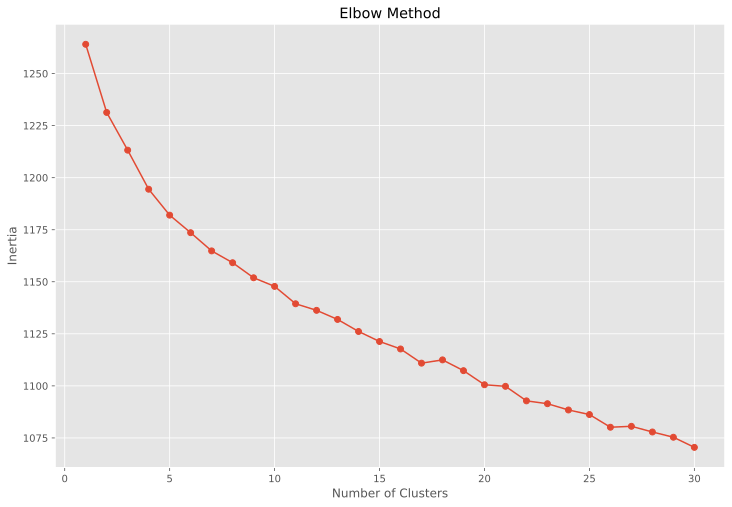

In [ ]:
num_clusters = range(1, 31)

# Elbow Method for Optimal Value of k in KMeans
inertias = []
for n in num_clusters:
    kmeans = KMeans(n_clusters=n)
    kmeans.fit(tfidf_matrix_reduced)
    inertias.append(kmeans.inertia_)

# Plot Elbow
plt.figure(figsize=(12, 8))
plt.plot(num_clusters, inertias, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

<font face="B Mitra"><div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
با توجه به نمودار رسم شده، به نظر می‌رسد اگر تعداد خوشه‌ها عددی بین 15 تا 20 باشد، عملکرد خوشه‌بندی نیز بهتر است (زیرا شیب نمودار از این بازه به بعد کم‌تر می‌شود)؛ البته شکل نمودار به صورت کاملا واضح به صورت یک آرنج در نیامده است و شاید تشخیص بهترین مقدار k از روی این نمودار کمی دشوار باشد، ولی با امتحان کردن چند k منتخب، می‌توان دید که انتخاب مقدار 17 برای k می‌تواند مناسب باشد؛ زیرا هم عملکرد بهتری نسبت به k با مقادیر زیر 10 دارد و هم مقدار آن خیلی زیاد و بیش‌تر از 20 تا نیست که تعداد خوشه‌هایمان هم خیلی زیاد شود. علاوه بر این دیده می‌شود که از k=17، شیب نمودار کم‌تر می‌شود. در واقع ما مقداری را برای k انتخاب کردیم که بین تعداد خوشه‌ها و عملکرد آن تناسب داشته باشد.
</font>
</div>

In [ ]:
optimal_k = 17

In [ ]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(tfidf_matrix_reduced)
kmeans_clusters = kmeans.predict(tfidf_matrix_reduced)
kmeans_clusters_labels = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<font face="B Mitra"><div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
نتایج خوشه‌بندی k-means را به این صورت چاپ می‌کنیم که به ما می‌گوید هر مقاله در چه خوشه‌ای قرار گرفته است.
</p>
</font>
</div>

In [ ]:
# Print Results
for i in range(len(processed_docs)):
    print(f'Aricle {i+1} in Cluster {kmeans_clusters[i]+1}')

Aricle 1 in Cluster 8
Aricle 2 in Cluster 17
Aricle 3 in Cluster 6
Aricle 4 in Cluster 9
Aricle 5 in Cluster 4
Aricle 6 in Cluster 14
Aricle 7 in Cluster 10
Aricle 8 in Cluster 4
Aricle 9 in Cluster 9
Aricle 10 in Cluster 9
Aricle 11 in Cluster 6
Aricle 12 in Cluster 4
Aricle 13 in Cluster 9
Aricle 14 in Cluster 5
Aricle 15 in Cluster 2
Aricle 16 in Cluster 5
Aricle 17 in Cluster 12
Aricle 18 in Cluster 9
Aricle 19 in Cluster 2
Aricle 20 in Cluster 1
Aricle 21 in Cluster 8
Aricle 22 in Cluster 6
Aricle 23 in Cluster 8
Aricle 24 in Cluster 14
Aricle 25 in Cluster 7
Aricle 26 in Cluster 17
Aricle 27 in Cluster 14
Aricle 28 in Cluster 10
Aricle 29 in Cluster 2
Aricle 30 in Cluster 6
Aricle 31 in Cluster 17
Aricle 32 in Cluster 9
Aricle 33 in Cluster 13
Aricle 34 in Cluster 6
Aricle 35 in Cluster 6
Aricle 36 in Cluster 4
Aricle 37 in Cluster 9
Aricle 38 in Cluster 12
Aricle 39 in Cluster 2
Aricle 40 in Cluster 9
Aricle 41 in Cluster 9
Aricle 42 in Cluster 4
Aricle 43 in Cluster 12
Aricle 4

<font face="B Mitra"><div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
برای ارزیابی کیفیت خوشه‌بندی، از دو معیار silhouette score و davies bouldin score استفاده می‌کنیم. وقتی این معیارها را برای خوشه‌بندی k-means خود حساب کنیم، می‌بینیم که معیار اول حدودا برابر 0.028 و معیار دوم حدودا برابر 4.73 شده است که نشان می‌دهد خوشه‌بندی از کیفیت متوسطی برخوردار است. می‌دانیم میزان معیار Silhouette Score هر چقدر به 1 نزدیک‌تر باشد خوشه‌بندی بهتر است و هر چقدر میزان معیار Davies Bouldin Score کمتر باشد خوشه‌بندی بهتر است.
</p>
</font>
</div>

In [ ]:
silhouette_kmeans = silhouette_score(tfidf_matrix_reduced, kmeans_clusters)
davies_bouldin_kmeans = davies_bouldin_score(tfidf_matrix_reduced, kmeans_clusters)
print(f"Silhouette Score for K-Means: {silhouette_kmeans}")
print(f"Davies Bouldin Score for K-Means: {davies_bouldin_kmeans}")

Silhouette Score for K-Means: 0.027565964014556434
Davies Bouldin Score for K-Means: 4.729823520545392


<font face="B Mitra">
<div dir=rtl>
<font size=5><font color='green'>
<b> بخش امتیازی </b>
<br>
<p align="justify">
<font size=5><font color='green'>
حال یک بار خوشه‌بندی را با استفاده از روش Agglomerative Clustering که نوعی خوشه‌بندی سلسله مراتبی است انجام می‌دهیم. برای پیدا کردن بهترین تعداد خوشه برای این روش، نموداری بر حسب میزان معیار Silhouette Score رسم می‌کنیم که برای هر مقدار در بازه 1 تا 30، خوشه‌بندی Agglomerative را انجام می‌دهد و معیار Silhouette را برای آن محاسبه می‌کند و به لیست agg_silhouette اضافه می‌کند.
<br>
در نمودار رسم شده، به دنبال نقطه‌ای می‌گردیم که تعداد خوشه آن از 20 بیش‌تر نباشد (برای اینکه تعداد خوشه‌ها خیلی زیاد نشود) و هم بالاترین مقدار silhouette را داشته باشد.
</p>
</font>
</div>

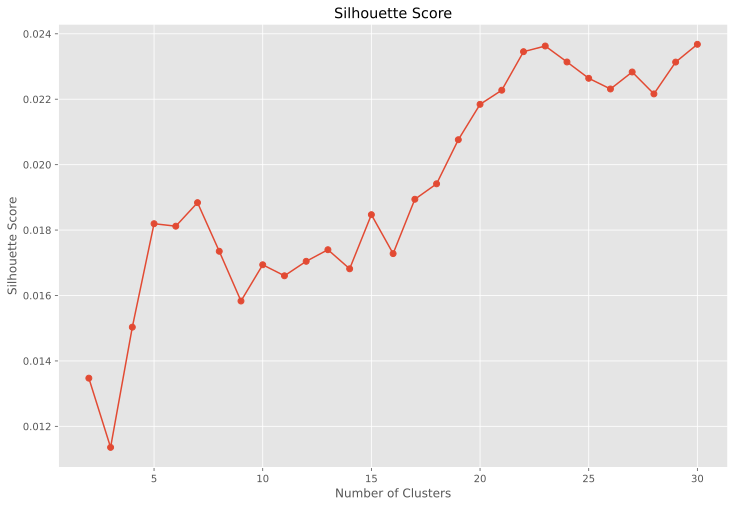

In [ ]:
# Find Optimal Value of Number of Clusters in Agglomerative Clustering
agg_silhouette = []
for n in num_clusters[1:]:
    agg_cluster = AgglomerativeClustering(n_clusters=n)
    agg_cluster.fit_predict(tfidf_matrix_reduced)
    agg_label = agg_cluster.labels_
    agg_silhouette.append(silhouette_score(tfidf_matrix_reduced, agg_label))

plt.figure(figsize=(12, 8))
plt.plot(num_clusters[1:], agg_silhouette, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
با توجه به نمودار رسم شده، می‌بینیم که اگر بخواهیم تعداد خوشه خیلی زیادی انتخاب نکنیم (یعنی بیش‌تر از 20 نباشد)، بهترین انتخاب مقدار 20 است که از تمامی مقادیر قبلی خود میزان Silhouette Score بیش‌تری دارد. اگر تعداد خیلی زیاد خوشه‌ها برایمان اهمیتی نداشت و تنها عملکرد خوشه‌بندی برایمان مهم بود، با توجه به نتایج نمودار مقدار 30 یا 23 برای تعداد خوشه‌بندی، بهترین عملکرد را در خوشه‌بندی داشتند.
</p>
</font>
</div>

In [ ]:
agg_optimal_num_clusters = 20

In [ ]:
# Agglomerative Clustering
agg_cluster = AgglomerativeClustering(n_clusters=agg_optimal_num_clusters)
agg_clusters = agg_cluster.fit_predict(tfidf_matrix_reduced)

<font face="B Mitra"><div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
برای ارزیابی کیفیت خوشه‌بندی مانند قسمت قبل، از دو معیار silhouette score و davies bouldin score استفاده می‌کنیم. وقتی این معیارها را برای خوشه‌بندی Agglomerative خود حساب کنیم، می‌بینیم که معیار اول حدودا برابر 0.022 و معیار دوم حدودا برابر 4.52 شده است که نشان می‌دهد خوشه‌بندی از کیفیت متوسطی برخوردار است. همان‌طور که گفتیم، میزان معیار Silhouette Score هر چقدر به 1 نزدیک‌تر باشد خوشه‌بندی بهتر است و هر چقدر میزان معیار Davies Bouldin Score کمتر باشد خوشه‌بندی بهتر است.
<br>
اگر بخواهیم بین این خوشه‌بندی و خوشه‌بندی قبلی مقایسه‌ای کنیم، می‌بینیم که معیار Silhouette Score برای خوشه‌بندی K-Means کمی بیش‌تر از خوشه‌بندی سلسله مراتبی شده است و معیار Davies Bouldin Score برای خوشه‌بندی سلسله مراتبی کمی بیش‌تر از خوشه‌بندی K-Means شده است، یعنی با اتکا به معیار اول به نظر می‌رسد که در این‌جا عملکرد خوشه‌بندی K-Means با اختلاف خیلی کمی بهتر از خوشه‌بندی سلسله مراتبی واقع شده است.
</p>
</font>
</div>

In [ ]:
silhouette_agg = silhouette_score(tfidf_matrix_reduced, agg_clusters)
davies_bouldin_agg = davies_bouldin_score(tfidf_matrix_reduced, agg_clusters)
print(f"Silhouette Score - Agglomerative Clustering: {silhouette_agg}")
print(f"Davies Bouldin Score - Agglomerative Clustering: {davies_bouldin_agg}")

Silhouette Score - Agglomerative Clustering: 0.021844038376602083
Davies Bouldin Score - Agglomerative Clustering: 4.522381373512572


<font face="B Mitra">
<div dir=rtl>
<font size=6>
<b> t-SNE </b>
<br>
<p align="justify">
<font size=5>
t_SNE یک روش نظارت نشده غیر خطی است که برای اکتشاف و بصری‌سازی داده‌ها مورد استفاده قرار می‌گیرد.
PCA یک روش کاهش ابعاد خطی است که در تلاش برای بیشینه کردن واریانس و حفظ فاصله‌های زیاد دوتایی‌ها از یکدیگر است. این امر می‌تواند منجر به بصری‌سازی ضعیف به ویژه هنگام کار با ساختارهای غیرخطی می‌شود. t-SNE  با حفظ فاصله‌های کم دوتایی‌ها یا شباهت محلی از PCA متمایز می‌شود. به بیان ساده‌تر، t-SNE به کاربر درکی از اینکه داده‌ها چگونه در فضای ابعاد بالا سازمان‌دهی شده‌اند را ارائه می‌کند. <br>
با استفاده از t-SNE می توانیم بردار ویژگی هایی با ابعاد بالا را به 2 بعد کاهش دهیم.
در این مجموعه داده در 2 بعد می توان توزیع مقالات را با استفاده از scatterplot نمایش داد. <br>
برای تفکیک بصری موضوعات مختلف در نمودار بالا، با استفاده از خوشه هایی که در KMeans یافتید، برای رنگ آمیزی خوشه های مختلف در مصورسازی خود میتوانید استفاده کنید.
</p>
</font>
</div>

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
الگوریتم t-SNE یک تکنیک کاهش بعد غیرخطی و بدون نظارت برای کاوش داده‌ها و تجسم داده‌های با ابعاد بالا است. این الگوریتم به ما امکان می‌دهد داده‌ها را در فضای کم‌ابعادی تجسم کنیم تا الگوها و روابط مخفی در داده‌ها را بهتر درک کنیم.
<br>
برخلاف PCA که یک تکنیک خطی است، t-SNE یک تکنیک غیرخطی است. PCA بیشتر برای داده‌هایی که ساختار خطی دارند مناسب است. این الگوریتم با تبدیل داده‌ها به بعد‌های پایین‌تر، کمینه‌سازی واریانس و حفظ فواصل بزرگ جفتی بین نقاط کار می‌کند. از طرف دیگر، t-SNE به حفظ شباهت‌های جفتی بین نقاط داده‌ها در فضای کم‌ابعادی تمرکز دارد. در واقع، PCA واریانس داده‌ها را حفظ می‌کند، در حالی که t-SNE روابط بین نقاط داده‌ای را در فضای کم‌ابعادی حفظ می‌کند. به همین دلیل، t-SNE یک الگوریتم مناسب برای تجسم داده‌های پیچیده با ابعاد بالا است.
<br>
در مورد عملکرد t-SNE، این الگوریتم ابتدا شباهت‌های جفتی بین نقاط داده‌ها را در فضای بالا‌تر از طریق هسته گوسی محاسبه می‌کند. سپس سعی می‌کند نقاط داده‌های بالا‌تر را در فضای کم‌ابعادی تجسم کند و در عین حفظ شباهت‌های جفتی، داده‌ها را بهینه‌سازی کند.
<br>
برای استفاده از این الگوریتم از کلاس t-SNE از کتابخانه sklearn استفاده می‌کنیم. داده‌هایی که به کمک این الگوریتم کاهش بعد داده شده‌اند را در features_2d ذخیره می‌کنیم که features_2d[:, 0] اشاره به مؤلفه‌ی اول t-SNE و features_2d[:, 1] اشاره به مؤلفه‌ی دوم t-SNE دارد.
<br>
با توجه به تعداد زیاد خوشه‌ها، تشخیص کیفیت خوشه‌بندی از روی نمودار t-SNE شاید کمی دشوار باشد، اما می‌توان دید که بعضی از خوشه‌ها به خوبی نفکیک و جداسازی شده‌اند و بعضی دیگر به خوبی جداسازی نشده‌اند. (مانند خوشه 8 که اعضای آن بسیار پراکنده هستند.)
</p>
</font>
</div>

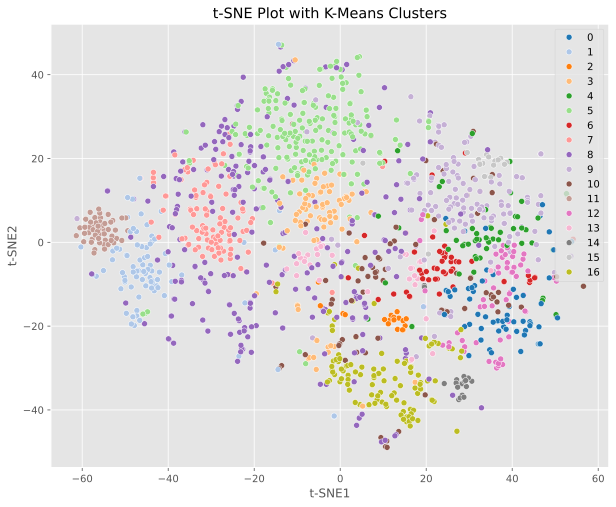

In [ ]:
# Reduce Dimensions Using t-SNE
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(tfidf_matrix_reduced)

# Color the Points Based on K-Means Clustering
plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=kmeans_clusters, palette='tab20', legend='full')
plt.title('t-SNE Plot with K-Means Clusters')
plt.xlabel('t-SNE1')
plt.ylabel('t-SNE2')
plt.show()

<font face="B Mitra">
<div dir=rtl>
<font size=6>
<b> مدلسازی موضوعی (Topic Modeling)</b>
<br>
<p align="justify">
<font size=5>
اکنون سعی خواهیم کرد موضوعات کلیدی در هر خوشه را پیدا کنیم.
<br>
 K-means مقالات را خوشه بندی کرد اما موضوعات را برچسب گذاری نکرد. از طریق مدل‌سازی موضوع، متوجه خواهیم شد که مهمترین اصطلاحات برای هر خوشه چیست. این کار با دادن کلمات کلیدی برای شناسایی سریع مضامین خوشه، معنای بیشتری به خوشه می بخشد.<br>
برای مدلسازی موضوعی از الگوریتم های مختلفی نظیر NMF,LSA,LDA میتوان استفاده کرد.
<br>
تعداد موضوعاتی که از خوشه ها قصد دارید استخراج کنید، را به دلخواه انتخاب کنید.
<br>
با استفاده از روش (Latent Dirichlet allocation)LDA موضوعات مناسب را به تعداد موردنظر برای هر خوشه بیابید.
سپس کلمات کلیدی هر موضوع برای خوشه موردنظر را چاپ کنید.
<br><b> بخش امتیازی:</b> مدلسازی موضوعی با روشی غیر از LDA انجام دهید و موضوعات خوشه ها را در هردو روش با هم مقایسه کنید.

</p>
</font>
</div>

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5><font color='green'>
الگوریتم LDA یک الگوریتم یادگیری بدون نظارت است. مشابه الگوریتم خوشه‌بندی K-Means، الگوریتم LDA سعی می‌کند کلمات و اسناد را به تعداد پیش‌فرضی از موضوع‌ها تقسیم کند. این موضوع‌ها سپس می‌توانند برای سازماندهی و جستجو در اسناد استفاده شوند.
<br>
هدف اصلی LDA، تشخیص ترکیب خطی از ویژگی‌ها است که به‌خوبی کلاس‌ها را در دیتاست جدا می‌کند. به عبارت دیگر، LDA می‌کوشد موضوع‌های مختلف موجود در اسناد را شناسایی کند.
<br>
برای پیاده‌سازی این الگوریتم، از کلاس LatentDirichletAllocation از کتابخانه sklearn استفاده می‌کنیم.
<br>
مدل LDA را به گونه‌ای تعریف می‌کنیم که برای هر خوشه، 10 موضوع را استخراج کند. سپس حلقه‌ای تعریف می‌کنیم که روی تک تک خوشه‌ها اجرا می‌شود و ایندکس هر متن خوشه را مشخص و متن نظیر ایندکس آن در ماتریس TF-IDF را پیدا می‌کند و تمامی این متون را در متغیر cluster_tfidf_matrix می‌ریزد. سپس مدل LDA بر روی cluster_tfidf_matrix اجرا می‌شود و در واقع 10 موضوع از متون هر خوشه استخراج می‌شود.
بعد از آن، 5 تا از مهم‌ترین کلمات کلیدی هر موضوع چاپ می‌شود.  
</p>
</font>
</div>

In [ ]:
# LDA Model
lda_model = LatentDirichletAllocation(n_components=10, random_state=42)

# Print the Top Keywords for Each Topic in Each Cluster
for cluster_num in range(optimal_k):
    print(f"Cluster {cluster_num + 1} Topics:")
    cluster_indices = [i for i, c in enumerate(kmeans_clusters_labels) if c == cluster_num]
    cluster_tfidf_matrix = tfidf_matrix[cluster_indices]
    lda_model.fit(cluster_tfidf_matrix)

    for topic_idx, topic in enumerate(lda_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[:-6:-1]]
        print(f"Topic {topic_idx + 1}: {', '.join(top_words)}")
    print("\n")

Cluster 1 Topics:
Topic 1: biomark, ms, fcov, longitudin, reject
Topic 2: sirna, rnai, hall, fa, pearson
Topic 3: cba, le, lymphoid, sexual, squamou
Topic 4: hav, cre, prrsv, slice, grew
Topic 5: plpro, gp, lectin, pseudotyp, dsrna
Topic 6: protein, structur, residu, bind, peptid
Topic 7: anova, autophagi, biomark, myeloid, fcov
Topic 8: anova, biomark, myeloid, fcov, dsdna
Topic 9: par, reoviru, tf, dsdna, sensor
Topic 10: dmv, mw, freez, tomographi, tubul


Cluster 2 Topics:
Topic 1: municip, confirm, china, forecast, januari
Topic 2: vacv, ili, auc, physician, pc
Topic 3: meme, shield, shed, chronic, strand
Topic 4: fl, infl, uenza, fi, export
Topic 5: tb, turkey, india, ministri, ventil
Topic 6: cfr, gr, fuzzi, india, visitor
Topic 7: mer, nosocomi, saudi, arabia, websit
Topic 8: ic, shield, regimen, counter, harbor
Topic 9: model, infect, case, epidem, estim
Topic 10: premis, wind, hors, equin, veloc


Cluster 3 Topics:
Topic 1: cat, fip, felin, fecv, fcov
Topic 2: regress, capit,

<font face="B Mitra">
<div dir=rtl>
<font size=5><font color='green'>
<b> بخش امتیازی </b>
<br>
<p align="justify">
<font size=5><font color='green'>
با مدل NMF مدل‌سازی موضوعی را انجام می‌دهیم. مراحل کار مانند مدل‌سازی با LDA است تنها نوع الگوریتم مدل‌سازی به کار رفته متفاوت است.
<br>
نتایج نشان می‌دهد که در مدل‌سازی NMF کلمات کلیدی ده موضوع هر خوشه، نسبت به مدل‌سازی LDA با یکدیگر تفاوت بیش‌تری دارند. در واقع در مدل‌سازی LDA، در اکثر خوشه‌ها، کلمات کلیدی بعضی از موضوعات بسیار به هم شباهت دارند (مانند خوشه 3). اما در مدل‌سازی NMF این شباهت و اشتراک بین کلمات کلیدی موضوعات هر خوشه کم‌تر است و ما شاهد تفاوت بیش‌تر موضوعات و کلمات کلیدی آن‌ها هستیم. بنابراین احتمالا می‌شود این‌طور نتیجه گرفت که مدل‌سازی NMF از عملکرد بهتری برخوردار است و بیش‌تر به ما در فهم کلمات کلیدی پرکاربرد و متنوع کمک می‌کند.
</p>
</font>
</div>

In [ ]:
# NMF Model
nmf_model = NMF(n_components=10)

# Print the Top Keywords for Each Topic in Each Cluster
for cluster_num in range(optimal_k):
    print(f"Cluster {cluster_num + 1} Topics:")
    cluster_indices = [i for i, c in enumerate(kmeans_clusters_labels) if c == cluster_num]
    cluster_tfidf_matrix = tfidf_matrix[cluster_indices]
    nmf_model.fit_transform(cluster_tfidf_matrix)

    for topic_idx, topic in enumerate(nmf_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[:-6:-1]]
        print(f"Topic {topic_idx + 1}: {', '.join(top_words)}")
    print("\n")

Cluster 1 Topics:
Topic 1: protein, inhibitor, ubiquitin, drug, activ
Topic 2: peptid, fusion, bind, inhibitor, sera
Topic 3: domain, residu, structur, et, motif
Topic 4: epitop, antigen, peptid, vaccin, score
Topic 5: rbd, spike, conform, trimer, state
Topic 6: gene, protein, target, sirna, use
Topic 7: rna, dsrna, protein, utr, viral
Topic 8: pro, crystal, residu, structur, pocket
Topic 9: glycan, bind, lectin, ligand, cba
Topic 10: subunit, channel, nmr, protein, proton


Cluster 2 Topics:


/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Topic 1: model, paramet, epidem, predict, individu
Topic 2: theorem, let, denot, assum, section
Topic 3: network, node, infect, simul, epidem
Topic 4: imag, learn, queri, train, dataset
Topic 5: control, preprint, epidem, case, municip
Topic 6: estim, case, reproduct, interv, day
Topic 7: outbreak, vacv, data, layer, premis
Topic 8: transmiss, infect, season, host, et
Topic 9: model, tree, sequenc, branch, prefer
Topic 10: citi, wuhan, hubei, case, china


Cluster 3 Topics:
Topic 1: cat, et, shelter, sampl, hous
Topic 2: fecv, cat, fipv, fcov, infect
Topic 3: fecal, fece, dog, diarrhea, sign
Topic 4: fip, felin, solut, sensor, antibodi
Topic 5: felv, fiv, spatial, seropreval, aggreg
Topic 6: odn, cat, cell, pbmc, stimul
Topic 7: hydrocephalu, dog, csf, et, ventricl
Topic 8: fcov, cat, korean, ii, type
Topic 9: canin, anim, cat, infect, carrier
Topic 10: cat, spp, felin, felv, mass


Cluster 4 Topics:
Topic 1: children, age, coinfect, year, studi
Topic 2: asthma, wheez, asthmat, year, a

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Topic 1: cell, rna, replic, hcv, viral
Topic 2: compound, mmol, activ, antivir, chromatographi
Topic 3: tgev, cell, infect, st, μm
Topic 4: hbv, hbsag, cypa, dna, liver
Topic 5: cell, medium, viru, titer, flask
Topic 6: cell, apoptosi, mapk, activ, pathway
Topic 7: extract, dri, activ, antivir, viru
Topic 8: nucleosid, antivir, activ, hsv, drug
Topic 9: cell, ebov, chloroquin, cbx, zikv
Topic 10: mrsa, mic, allergen, antimicrobi, concentr


Cluster 6 Topics:


/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Topic 1: patient, studi, hospit, admiss, sever
Topic 2: ct, imag, chest, patient, lung
Topic 3: transplant, patient, gvhd, recipi, hsct
Topic 4: ard, ventil, patient, lung, pressur
Topic 5: day, case, infect, fever, symptom
Topic 6: patient, treatment, therapi, trial, drug
Topic 7: patient, hospit, infect, staff, care
Topic 8: pneumonia, patient, antibiot, cap, icu
Topic 9: lung, airway, asthma, fi, pulmonari
Topic 10: ace, diabet, injuri, infect, hypertens


Cluster 7 Topics:
Topic 1: sera, elisa, igm, igg, assay
Topic 2: mab, epitop, prrsv, viru, infect
Topic 3: scfv, antibodi, tgev, fragment, fab
Topic 4: neutral, assay, luciferas, cell, titer
Topic 5: mice, immun, rbd, vaccin, protein
Topic 6: titer, pig, plasma, anim, wt
Topic 7: antibodi, neutral, repertoir, cell, bind
Topic 8: phage, librari, epitop, display, peptid
Topic 9: antigen, inactiv, dilut, grid, min
Topic 10: protein, serum, nucleocapsid, sampl, antibodi


Cluster 8 Topics:
Topic 1: health, public, countri, nation, sur

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Topic 1: patient, tissu, cell, intestin, sar
Topic 2: ifn, type, cell, antivir, respons
Topic 3: cell, express, cultur, protein, line
Topic 4: mice, infect, lung, wt, dpi
Topic 5: sirna, gene, rnai, shrna, express
Topic 6: macrophag, autophagi, lp, cell, activ
Topic 7: protein, infect, immun, host, respons
Topic 8: exosom, septic, ab, cell, bo
Topic 9: angiotensin, receptor, lung, express, activ
Topic 10: nk, cell, liver, transplant, ctl


Cluster 11 Topics:


/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Topic 1: et, cell, activ, immun, peptid
Topic 2: et, virus, hmpv, respiratori, detect
Topic 3: speci, et, soil, forest, host
Topic 4: et, protein, replic, membran, er
Topic 5: sirna, et, rnai, lipid, target
Topic 6: camel, et, dromedari, infect, diseas
Topic 7: particl, virus, viru, sediment, em
Topic 8: wnv, denv, et, urban, forest
Topic 9: anim, infect, parasit, dog, et
Topic 10: et, dna, biosensor, microfluid, isav


Cluster 12 Topics:
Topic 1: preprint, licens, medrxiv, perpetu, copyright
Topic 2: model, preprint, infect, licens, social
Topic 3: patient, preprint, group, sever, licens
Topic 4: case, wuhan, preprint, travel, hubei
Topic 5: swab, preprint, sampl, licens, µl
Topic 6: bed, preprint, india, scenario, forecast
Topic 7: mask, preprint, decontamin, medrxiv, licens
Topic 8: counti, preprint, spot, medrxiv, hot
Topic 9: preprint, reus, medrxiv, patient, permiss
Topic 10: asymptomat, case, preprint, medrxiv, studi


Cluster 13 Topics:
Topic 1: protein, fusion, rat, purifi, ex

<font face="B Mitra">
<div dir=rtl>
<font size=6>
<b>  مصورسازی </b>
<br>
<p align="justify">
<font size=4>
<b>این بخش شامل نمره نیست و صرفا جهت درک شما از مراحل انجام شده است</b><br>
<font size=5>
مراحل قبلی برچسب‌های خوشه‌بندی و مجموعه‌ای از مقالات را به دو بعد کاهش داده است. می‌توانیم یک طرح تعاملی از خوشه ها ایجاد کنیم. <br>
شما میتوانید با انتخاب هر خوشه از اسلایدر، توزیع هر خوشه را به صورت مجزا مشاهده کنید. همچنین میتوانید با بردن نشانگر روی هریک از نقاط مشخصات کلی آن مقاله را مشاهده کنید.
<br>
<img src="https://drive.google.com/uc?id=14xXSuD-FhmSSJBI0oH-a-DDkgjBtqj4_" alt="Linear Algebra Cover Art" width="800">
</p>
</font>
</div>

<font face="B Mitra">
<div dir=rtl>
<p align="justify">
<font size=5>
ورودی تابع زیر، دیتافریم مقالات می‌باشد که می‌بایست شامل ستون‌های زیر باشد:
<br>
1. <code>tsne-2d-one</code>: مولفهٔ اول t-SNE
<br>
2. <code>tsne-2d-two</code>: مولفهٔ دوم t-SNE
<br>
3. <code>y</code>: خوشهٔ هر یک از مقالات
</p>
</font>
</div>

In [ ]:
def interactive_plot(df):
    clusters = sorted(df['y'].unique())

    # Generate distinct colors for each cluster using Plotly's colors
    colors = px.colors.qualitative.Plotly

    # Create a scatter plot for each cluster with a unique color
    data = []
    for i, cluster in enumerate(clusters):
        cluster_data = df[df['y'] == cluster]
        scatter = go.Scatter(
            x=cluster_data['tsne-2d-one'],
            y=cluster_data['tsne-2d-two'],
            mode='markers',
            name=f'Cluster {cluster}',
            text=cluster_data['title'],
            hoverinfo='text',
            marker=dict(size=10, color=colors[i % len(colors)]),  # Assign a unique color
            visible=False  # Initially, make all traces invisible
        )
        data.append(scatter)

    # Add a scatter plot for all clusters with different colors
    scatter_all = go.Scatter(
        x=df['tsne-2d-one'],
        y=df['tsne-2d-two'],
        mode='markers',
        name='All Clusters',
        text=df['title'],
        hoverinfo='text',
        marker=dict(size=10, color=df['y'].map(lambda x: colors[x % len(colors)])),  # Assign colors by cluster
        visible=True  # Initially, show all clusters
    )
    data.append(scatter_all)

    x_min = df['tsne-2d-one'].min()
    x_max = df['tsne-2d-one'].max()
    y_min = df['tsne-2d-two'].min()
    y_max = df['tsne-2d-two'].max()

    # Initialize the figure
    fig = go.Figure(data=data)

    # Ensure square aspect ratio
    fig.update_layout(
        title='Cluster Visualization',
        xaxis=dict(title='t-SNE 1', range=[x_min, x_max]),  # Ensure x and y axes are equal
        yaxis=dict(title='t-SNE 2', range=[y_min, y_max]),
        width=1000,
        height=700  # Ensure the figure is square-shaped
    )

    # Add hover functionality
    fig.update_traces(
        hoverinfo='text',
        marker=dict(opacity=0.7, size=8),
    )

    # Add interactive slider for cluster selection
    steps = []
    for i, cluster in enumerate(clusters):
        step = dict(
            method='update',
            args=[{'visible': [False] * len(clusters) + [False]},  # Hide all clusters
                {'title': f'Cluster {cluster}'}],
            label=f'Cluster {cluster}'
        )
        # Only make the current cluster visible
        step['args'][0]['visible'][i] = True
        steps.append(step)

    # Add final step for all clusters
    steps.append(dict(
        method='update',
        args=[{'visible': [False] * len(clusters) + [True]},  # Only show the 'all clusters' trace
            {'title': 'All Clusters'}],
        label='All Clusters'
    ))

    sliders = [dict(
        active=len(steps) - 1,
        currentvalue={"prefix": "Cluster: "},
        pad={"t": 50},
        steps=steps
    )]

    fig.update_layout(
        sliders=sliders
    )

    # Display the plot
    fig.show()